# Music Recommendation System - Spotify

## Step 1  - Import Libraries

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Import necessary libraries for handling files and data
import os  # Operating system functions
import numpy as np  # Numerical computations
import pandas as pd  # Data manipulation and analysis

# Import libraries for data visualization
import seaborn as sns  # Statistical data visualization
import plotly.express as px  # Interactive visualizations
import matplotlib.pyplot as plt  # Basic plotting
%matplotlib inline

# Import scikit-learn components for machine learning tasks
from sklearn.cluster import KMeans  # K-Means clustering algorithm
from sklearn.preprocessing import StandardScaler  # Data preprocessing (scaling)
from sklearn.pipeline import Pipeline  # Constructing data processing pipelines
from sklearn.manifold import TSNE  # t-SNE for dimensionality reduction
from sklearn.decomposition import PCA  # Principal Component Analysis (PCA)
from sklearn.metrics import euclidean_distances  # Euclidean distance computation
from scipy.spatial.distance import cdist  # Distance computation for clustering

# Import warnings to suppress unnecessary warnings
import warnings
warnings.filterwarnings("ignore")  # Suppress warnings


## Step 2 - Improting Dataset

In [ ]:
# Read the main dataset from the CSV file "data.csv"
data = pd.read_csv("/content/drive/MyDrive/DS Notes/Step 24 - Recommender System/Music Recommendation System/data.csv")

# Read aggregated genre data from the CSV file "data_by_genres.csv"
genre_data = pd.read_csv('/content/drive/MyDrive/DS Notes/Step 24 - Recommender System/Music Recommendation System/data_by_genres.csv')

# Read aggregated year data from the CSV file "data_by_year.csv"
year_data = pd.read_csv('/content/drive/MyDrive/DS Notes/Step 24 - Recommender System/Music Recommendation System/data_by_year.csv')


In [ ]:
# Print information about the 'data' DataFrame
print(data.info())


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 170653 entries, 0 to 170652
Data columns (total 19 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   valence           170653 non-null  float64
 1   year              170653 non-null  int64  
 2   acousticness      170653 non-null  float64
 3   artists           170653 non-null  object 
 4   danceability      170653 non-null  float64
 5   duration_ms       170653 non-null  int64  
 6   energy            170653 non-null  float64
 7   explicit          170653 non-null  int64  
 8   id                170653 non-null  object 
 9   instrumentalness  170653 non-null  float64
 10  key               170653 non-null  int64  
 11  liveness          170653 non-null  float64
 12  loudness          170653 non-null  float64
 13  mode              170653 non-null  int64  
 14  name              170653 non-null  object 
 15  popularity        170653 non-null  int64  
 16  release_date      17

In [ ]:
# Print information about the 'genre_data' DataFrame
print(genre_data.info())


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2973 entries, 0 to 2972
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   mode              2973 non-null   int64  
 1   genres            2973 non-null   object 
 2   acousticness      2973 non-null   float64
 3   danceability      2973 non-null   float64
 4   duration_ms       2973 non-null   float64
 5   energy            2973 non-null   float64
 6   instrumentalness  2973 non-null   float64
 7   liveness          2973 non-null   float64
 8   loudness          2973 non-null   float64
 9   speechiness       2973 non-null   float64
 10  tempo             2973 non-null   float64
 11  valence           2973 non-null   float64
 12  popularity        2973 non-null   float64
 13  key               2973 non-null   int64  
dtypes: float64(11), int64(2), object(1)
memory usage: 325.3+ KB
None


In [ ]:
# Print information about the 'year_data' DataFrame
print(year_data.info())


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   mode              100 non-null    int64  
 1   year              100 non-null    int64  
 2   acousticness      100 non-null    float64
 3   danceability      100 non-null    float64
 4   duration_ms       100 non-null    float64
 5   energy            100 non-null    float64
 6   instrumentalness  100 non-null    float64
 7   liveness          100 non-null    float64
 8   loudness          100 non-null    float64
 9   speechiness       100 non-null    float64
 10  tempo             100 non-null    float64
 11  valence           100 non-null    float64
 12  popularity        100 non-null    float64
 13  key               100 non-null    int64  
dtypes: float64(11), int64(3)
memory usage: 11.1 KB
None


# Step 3 - Data Understanding by Visualization and EDA

### Step 3.1 - Feature Correlation

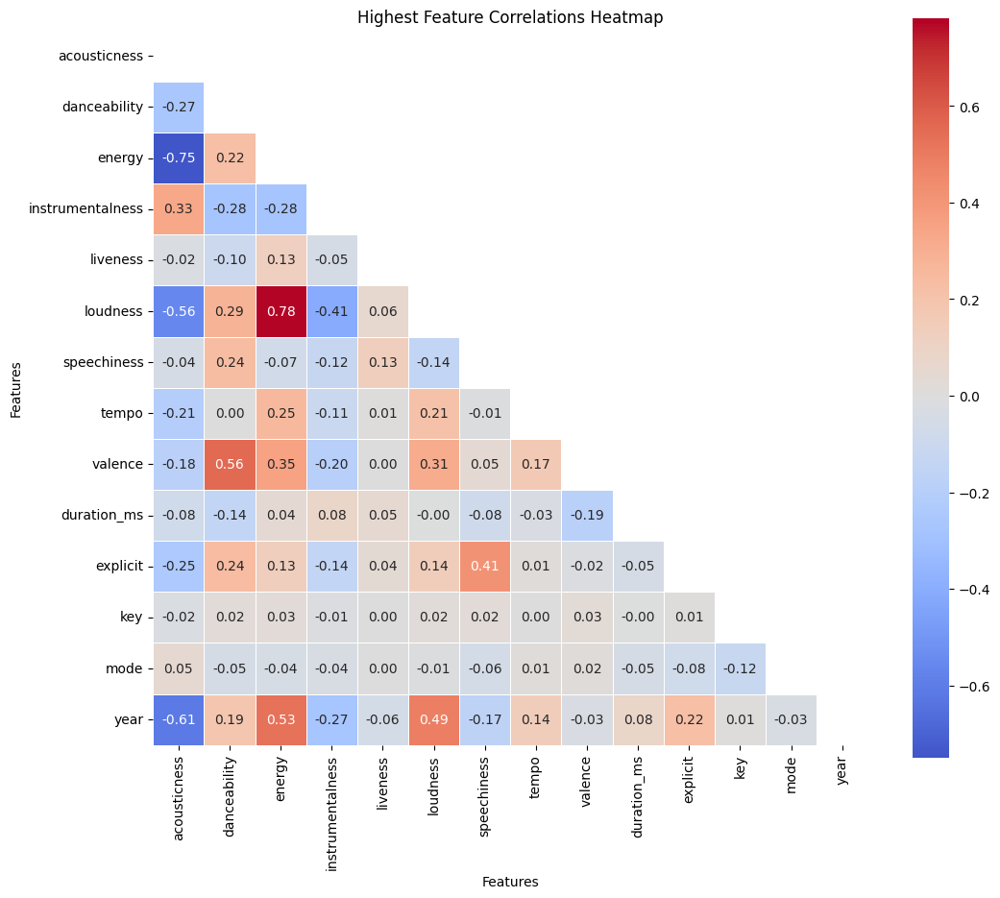

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# List of feature names
feature_names = ['acousticness', 'danceability', 'energy', 'instrumentalness',
                'liveness', 'loudness', 'speechiness', 'tempo', 'valence',
                'duration_ms', 'explicit', 'key', 'mode', 'year']

# Define features and target variables
X, y = data[feature_names], data['popularity']

# Calculate the correlation matrix between features
correlation_matrix = X.corr()

# Filter out self-correlations and duplicates by selecting the upper triangle of the matrix
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))
correlation_matrix_filtered = correlation_matrix.mask(mask)

# Set the figure size for the heatmap
plt.figure(figsize=(12, 10))

# Generate a heatmap using seaborn for the highest correlations
sns.heatmap(correlation_matrix_filtered, annot=True, cmap='coolwarm', center=0, linewidths=0.5,
            square=True, fmt=".2f", xticklabels=True, yticklabels=True)

# Set title and labels for the heatmap
plt.title('Highest Feature Correlations Heatmap')
plt.xlabel('Features')
plt.ylabel('Features')

# Show the heatmap
plt.show()


### Step 3.2 - Music Over Time

Using the data grouped by year, we can understand how the overall sound of music has changed from 1921 to 2020.

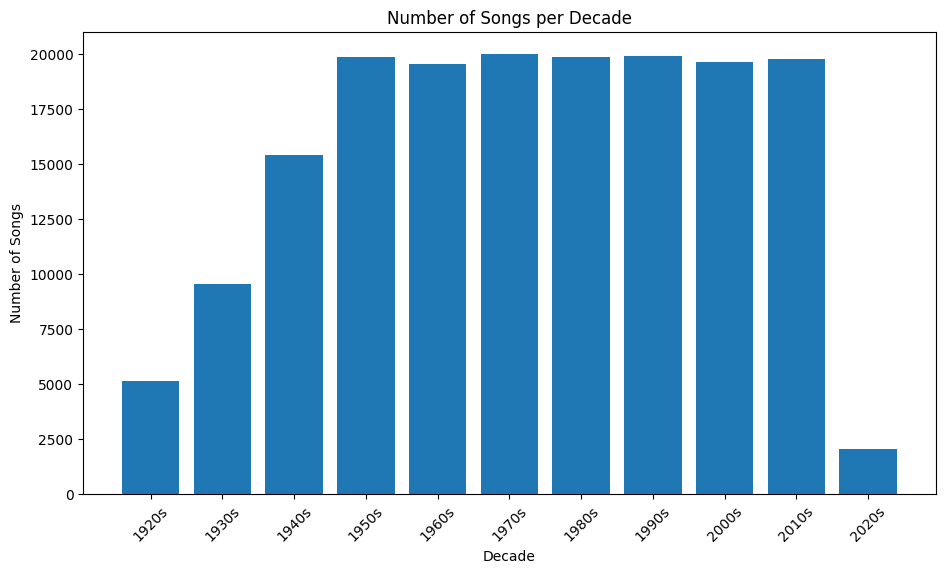

In [ ]:
# Import necessary libraries
import matplotlib.pyplot as plt
import pandas as pd

# Function to get the decade from a given year
def get_decade(year):
    period_start = int(year / 10) * 10
    decade = '{}s'.format(period_start)
    return decade

# Apply the get_decade function to create a new 'decade' column in the DataFrame
data['decade'] = data['year'].apply(get_decade)

# Count the occurrences of each decade
decade_counts = data['decade'].value_counts().sort_index()

# Create a bar plot using Matplotlib
plt.figure(figsize=(11, 6))
plt.bar(decade_counts.index, decade_counts.values)

# Set plot title and labels
plt.title('Number of Songs per Decade')
plt.xlabel('Decade')
plt.ylabel('Number of Songs')

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Show the plot
plt.show()


### Step 3.3 - Music Features

In [ ]:
# Import necessary libraries
import plotly.express as px

# List of sound features to visualize
sound_features = ['acousticness', 'danceability', 'energy', 'instrumentalness', 'liveness', 'valence']

# Create a line plot using Plotly Express
fig = px.line(
    year_data,            # DataFrame containing data
    x='year',             # X-axis data: years
    y=sound_features      # Y-axis data: list of sound features
)

# Show the line plot
fig.show()


### Step 3.4 - Characteristics of Different Genres

This dataset contains the audio features for different songs along with the audio features for different genres. We can use this information to compare different genres and understand their unique differences in sound.

In [ ]:
# Import necessary libraries
import plotly.express as px

# Select the top 10 genres with the highest popularity
top10_genres = genre_data.nlargest(10, 'popularity')

# Create a grouped bar plot using Plotly Express
fig = px.bar(
    top10_genres,                   # DataFrame containing data
    x='genres',                     # X-axis data: genre names
    y=['valence', 'energy', 'danceability', 'acousticness'],  # Y-axis data: attributes
    barmode='group'                 # Grouped bar mode
)

# Show the grouped bar plot
fig.show()


### Step 3.5 - Clustering Genres with K-Means

Here, the simple K-means clustering algorithm is used to divide the genres in this dataset into ten clusters based on the numerical audio features of each genres.

In [ ]:
# Import necessary libraries
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
import numpy as np

# Create a pipeline for clustering
cluster_pipeline = Pipeline([
    ('scaler', StandardScaler()),  # Standardize the features
    ('kmeans', KMeans(n_clusters=10))  # Apply K-Means with 10 clusters
])

# Select numerical features for clustering from the 'genre_data' DataFrame
X = genre_data.select_dtypes(np.number)

# Fit the clustering pipeline to the data
cluster_pipeline.fit(X)

# Predict cluster labels for the data
genre_data['cluster'] = cluster_pipeline.predict(X)


In [ ]:
# Import necessary libraries
from sklearn.manifold import TSNE
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
import pandas as pd
import plotly.express as px

# Create a pipeline with scaling and t-SNE
tsne_pipeline = Pipeline([
    ('scaler', StandardScaler()),  # Standardize the features
    ('tsne', TSNE(n_components=2, verbose=1))  # Apply t-SNE with 2 components
])

# Apply t-SNE to the feature matrix 'X' to get genre embeddings
genre_embedding = tsne_pipeline.fit_transform(X)

# Create a DataFrame to store the t-SNE results
projection = pd.DataFrame(columns=['x', 'y'], data=genre_embedding)
projection['genres'] = genre_data['genres']  # Add genre labels
projection['cluster'] = genre_data['cluster']  # Add cluster labels

# Create a scatter plot using Plotly Express
fig = px.scatter(
    projection,
    x='x',
    y='y',
    color='cluster',
    hover_data=['x', 'y', 'genres']  # Show additional data on hover
)

# Show the scatter plot
fig.show()


[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 2973 samples in 0.015s...
[t-SNE] Computed neighbors for 2973 samples in 0.509s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2973
[t-SNE] Computed conditional probabilities for sample 2000 / 2973
[t-SNE] Computed conditional probabilities for sample 2973 / 2973
[t-SNE] Mean sigma: 0.777516
[t-SNE] KL divergence after 250 iterations with early exaggeration: 76.106277
[t-SNE] KL divergence after 1000 iterations: 1.395306


### Step 3.6 - Clustering Songs with K-Means

In [ ]:
# Import necessary libraries
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import numpy as np

# Define the song_cluster_pipeline
song_cluster_pipeline = Pipeline([
    ('scaler', StandardScaler()),  # Standardize the features
    ('kmeans', KMeans(n_clusters=20, verbose=False))  # Apply K-Means with 20 clusters
], verbose=False)

# Select numerical features as 'X' for clustering
X = data.select_dtypes(np.number)

# Get the list of numerical column names
number_cols = list(X.columns)

# Fit the song_cluster_pipeline to the data
song_cluster_pipeline.fit(X)

# Predict cluster labels for the data
song_cluster_labels = song_cluster_pipeline.predict(X)

# Add cluster labels to the 'data' DataFrame
data['cluster_label'] = song_cluster_labels


In [ ]:
# Import necessary libraries
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
import pandas as pd
import plotly.express as px

# Create a pipeline with scaling and PCA
pca_pipeline = Pipeline([
    ('scaler', StandardScaler()),  # Standardize the features
    ('PCA', PCA(n_components=2))    # Apply PCA with 2 components
])

# Apply PCA to the feature matrix 'X' to get song embeddings
song_embedding = pca_pipeline.fit_transform(X)

# Create a DataFrame to store the PCA results
projection = pd.DataFrame(columns=['x', 'y'], data=song_embedding)
projection['title'] = data['name']  # Add song titles
projection['cluster'] = data['cluster_label']  # Add cluster labels

# Create a scatter plot using Plotly Express
fig = px.scatter(
    projection,
    x='x',
    y='y',
    color='cluster',
    hover_data=['x', 'y', 'title']  # Show additional data on hover
)

# Show the scatter plot
fig.show()


# Step 4 - Build Recommender System using nearest neighbours

* Based on the analysis and visualizations, it’s clear that similar genres tend to have data points that are located close to each other while similar types of songs are also clustered together.

* This observation makes perfect sense. Similar genres will sound similar and will come from similar time periods while the same can be said for songs within those genres. We can use this idea to build a recommendation system by taking the data points of the songs a user has listened to and recommending songs corresponding to nearby data points.

* [Spotipy](https://spotipy.readthedocs.io/en/2.16.1/) is a Python client for the Spotify Web API that makes it easy for developers to fetch data and query Spotify’s catalog for songs. You have to install using `pip install spotipy`

* After installing Spotipy, you will need to create an app on the [Spotify Developer’s page](https://developer.spotify.com/) and save your Client ID and secret key.

In [ ]:
!pip install spotipy

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 250.1/250.1 kB 4.2 MB/s eta 0:00:00


### Step 4.1 - Spotify API

In [ ]:
# Import necessary libraries
import spotipy
from spotipy.oauth2 import SpotifyClientCredentials
from collections import defaultdict
from sklearn.metrics import euclidean_distances  # Import euclidean_distances for computing Euclidean distances
from scipy.spatial.distance import cdist  # Import cdist for computing distance matrices
import difflib  # Import difflib for string similarity comparisons

# Set up Spotify API authentication
client_id = "09516531b7494f2396e06405434bddf5"
client_secret = "2e462d2a1b1c4f27988d3e71d60b064c"
client_credentials_manager = SpotifyClientCredentials(client_id=client_id, client_secret=client_secret)
sp = spotipy.Spotify(client_credentials_manager=client_credentials_manager)


### Step 4.2 - Find song Function

In [ ]:
# Define a function to find song information by name and year

def find_song(name, year):
    # Initialize a defaultdict to store song data
    song_data = defaultdict()

    # Search for the song using Spotify API
    results = sp.search(q='track: {} year: {}'.format(name, year), limit=1)

    # If no results are found, return None
    if results['tracks']['items'] == []:
        return None

    # Retrieve track details from the search results
    results = results['tracks']['items'][0]
    track_id = results['id']

    # Get audio features for the track using its ID
    audio_features = sp.audio_features(track_id)[0]

    # Add basic song details to the song_data dictionary
    song_data['name'] = [name]
    song_data['year'] = [year]
    song_data['explicit'] = [int(results['explicit'])]
    song_data['duration_ms'] = [results['duration_ms']]
    song_data['popularity'] = [results['popularity']]

    # Add audio features to the song_data dictionary
    for key, value in audio_features.items():
        song_data[key] = value

    # Create and return a pandas DataFrame with song information
    return pd.DataFrame(song_data)

### Step 4.3 - Pre-processing Data

In [ ]:
# List of numerical columns in the dataset
number_cols = ['valence', 'year', 'acousticness', 'danceability', 'duration_ms', 'energy', 'explicit',
               'instrumentalness', 'key', 'liveness', 'loudness', 'mode', 'popularity', 'speechiness', 'tempo']

# Function to retrieve song data from the dataset or Spotify API
def get_song_data(song, spotify_data):
    try:
        # Attempt to find song data within the dataset
        song_data = spotify_data[(spotify_data['name'] == song['name'])
                                & (spotify_data['year'] == song['year'])].iloc[0]
        return song_data
    except IndexError:
        # If not found, use the find_song function (assumed to be defined elsewhere)
        return find_song(song['name'], song['year'])  # Make sure find_song is defined

# Function to calculate the mean vector of a list of songs
def get_mean_vector(song_list, spotify_data):
    song_vectors = []
    for song in song_list:
        # Get song data for each song in the list
        song_data = get_song_data(song, spotify_data)
        if song_data is None:
            print('Warning: {} does not exist in Spotify or in the database'.format(song['name']))
            continue
        song_vector = song_data[number_cols].values  # Extract numerical values
        song_vectors.append(song_vector)
    song_matrix = np.array(list(song_vectors))  # Convert to a numpy array
    return np.mean(song_matrix, axis=0)  # Calculate the mean vector

# Function to flatten a list of dictionaries into a dictionary of lists
def flatten_dict_list(dict_list):
    flattened_dict = defaultdict()  # Create a defaultdict for flattened data
    for key in dict_list[0].keys():
        flattened_dict[key] = []  # Initialize lists for each key
    for dictionary in dict_list:
        for key, value in dictionary.items():
            flattened_dict[key].append(value)  # Append values to respective lists
    return flattened_dict  # Return the flattened dictionary


### Step 4.4 - Recommendation Function

In [ ]:
# Function to recommend songs based on input song list and song data
def recommend_songs(song_list, spotify_data, n_songs=10):
    metadata_cols = ['name', 'year', 'artists']  # Metadata columns to be included in recommendations
    song_dict = flatten_dict_list(song_list)  # Flatten the input song list
    song_center = get_mean_vector(song_list, spotify_data)  # Calculate mean vector for input songs
    scaler = song_cluster_pipeline.steps[0][1]  # Assuming song_cluster_pipeline is defined elsewhere
    scaled_data = scaler.transform(spotify_data[number_cols])  # Scale the data
    scaled_song_center = scaler.transform(song_center.reshape(1, -1))  # Scale the mean vector
    distances = cdist(scaled_song_center, scaled_data, 'cosine')  # Compute cosine distances
    index = list(np.argsort(distances)[:, :n_songs][0])  # Get indices of closest songs
    rec_songs = spotify_data.iloc[index]  # Select recommended songs based on indices
    rec_songs = rec_songs[~rec_songs['name'].isin(song_dict['name'])]  # Exclude input songs
    return rec_songs[metadata_cols].to_dict(orient='records')  # Convert recommendations to dictionary format

## Step 5 - Actual Recommendation

In [ ]:
# Call the recommend_songs function to get recommended songs
song_list = [
    {'name': 'Be My Lover', 'year': 1996},
    {'name': 'What Is Love', 'year': 1993},
]

# Call the recommend_songs function to get recommended songs based on the input song list
# Adjust 'data' to your actual song data and 'n_songs' to the desired number of recommendations
recommended_songs = recommend_songs(song_list, data, n_songs=10)

# Print the recommended songs
print("Recommended Songs:")
for i, song in enumerate(recommended_songs, start=1):
    # Print the details of each recommended song
    print(f"{i}. Song Name: {song['name']}")
    print(f"   Year: {song['year']}")
    print(f"   Artists: {(song['artists'])}")
    print("===================")


Recommended Songs:
1. Song Name: The Weekend - Radio Edit
   Year: 2007
   Artists: ['Michael Gray']
2. Song Name: Last Friday Night (T.G.I.F.)
   Year: 2012
   Artists: ['Katy Perry']
3. Song Name: Last Friday Night (T.G.I.F.)
   Year: 2010
   Artists: ['Katy Perry']
4. Song Name: FANCY
   Year: 2019
   Artists: ['TWICE']
5. Song Name: La Copa de la Vida (La Cancion Oficial de la Copa Mundial, Francia '98) - Spanglish Radio Edit
   Year: 1999
   Artists: ['Ricky Martin']
6. Song Name: My Number
   Year: 2013
   Artists: ['Foals']
7. Song Name: The Future Freaks Me Out
   Year: 2003
   Artists: ['Motion City Soundtrack']
8. Song Name: Who Do You Think You Are
   Year: 1996
   Artists: ['Spice Girls']
9. Song Name: Uptown Girl - Radio Edit
   Year: 2000
   Artists: ['Westlife']
10. Song Name: You Spin Me Round (Like a Record)
   Year: 1985
   Artists: ['Dead Or Alive']
